## This is Part 1 of a project where i attempt to classify race finish status of drivers at each race of a Formula 1 season.
### In this notebook, i will create the dataset containing selected features and perform EDA (mainly with the help of Altair package), while in Part 2, I will perform the classification.

In [18]:
%run F1_classes_func.ipynb

### Import datasets

<b>Where can I find publicly available Formula 1 data? What are the potential features that could help identify whether a driver will finish a race or not? These are the questions I had when i first started out on this crazy project to use machine learning algorithms to predict race finishes.</b>
<b>Initial brainstorming based on my contextual knoweledge of the sport threw up these potential areas to look into:</b>
- Weather
- Safety Car appearances
- Qualifying position
- Pitstops
- Tyres
- Overtaking

<b>1. I found a kaggle dataset that contains information of qualifying position, pit stop timings and race results. This same data can also be extracted with an API call from the Ergast Developer API.</b>

<b>2. As for weather and safety car statistics, I pieced together the information myself for each race based on information published on this blog. This blog is also an excellent resource to gain insight to race strategy!</b>

<b>3. Pirelli has a section on its site dedicated to its infographics which details each race's allocated tyre
types, number of tyre sets per type each driver chooses to bring along for each race, as well as each driver's stint length (ie. number of laps spent on a tyre type). The infographics are all images, so unfortunately there is manual work involved in recording the information.</b>

<b>4. Race overtaking information can be gained by have a paid account with www.cliptheapex.com.</b>

Below, I import all the relevant datasets.

#### 1) Dataframe of Race finish statuses and position numbers

In [19]:
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_results.head()

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22.0,1,1.0,1,1,10.0,58,34:50.6,5690616.0,39.0,2.0,01:27.5,218.3,1
1,2,18,2,2,3.0,5,2.0,2,2,8.0,58,5.478,5696094.0,41.0,3.0,01:27.7,217.586,1
2,3,18,3,3,7.0,7,3.0,3,3,6.0,58,8.163,5698779.0,41.0,5.0,01:28.1,216.719,1
3,4,18,4,4,5.0,11,4.0,4,4,5.0,58,17.181,5707797.0,58.0,7.0,01:28.6,215.464,1
4,5,18,5,1,23.0,3,5.0,5,5,4.0,58,18.014,5708630.0,43.0,1.0,01:27.4,218.385,1


#### 2) Dataframe containing qualifying information of each driver at each race

In [20]:
df_qualifying = pd.read_csv('./formula-1-race-data/qualifying.csv')
df_qualifying.head()

,qualifyId,raceId,driverId,constructorId,number,position,q1,q2,q3
0,1,18,1,1,22,1,1:26.572,1:25.187,1:26.714
1,2,18,9,2,4,2,1:26.103,1:25.315,1:26.869
2,3,18,5,1,23,3,1:25.664,1:25.452,1:27.079
3,4,18,13,6,2,4,1:25.994,1:25.691,1:27.178
4,5,18,2,2,3,5,1:25.960,1:25.518,1:27.236


#### 3) Dataframe containing pitstop information at each race

In [21]:
df_pitStops = pd.read_csv('./formula-1-race-data/pitStops.csv')
df_pitStops.head()

,raceId,driverId,stop,lap,time,duration,milliseconds
0,841,153,1,1,17:05:23,26.898,26898
1,841,30,1,1,17:05:52,25.021,25021
2,841,17,1,11,17:20:48,23.426,23426
3,841,4,1,12,17:22:34,23.251,23251
4,841,13,1,13,17:24:10,23.842,23842


#### 4) Dataframe containing weather labels and SC appearance labels (Overtaking figures and SC Laps can be ignored)

In [22]:
xl = pd.ExcelFile("./formula-1-race-data/cliptheapex.xlsx", encoding='utf-8')
xl.sheet_names
weather = xl.parse("Sheet16")
weather['name'] = weather['name'] + " Grand Prix"
weather.replace("Dy", "Dry", inplace=True)
weather.head()

,Race,name,SC Laps,weather,overtakes,year
0,1,Australian Grand Prix,12.0,Dry,12.0,2008
1,2,Malaysian Grand Prix,NaN,Dry,5.0,2008
2,3,Bahrain Grand Prix,NaN,Dry,13.0,2008
3,4,Spanish Grand Prix,9.0,Dry,2.0,2008
4,5,Turkish Grand Prix,2.0,Dry,11.0,2008


#### 5) Dataframe containing overtaking information of each driver at each race

In [23]:
df_overtake = pd.read_csv(directory+"df_overtake.csv")
df_overtake.head()

,Unnamed: 0,lap,name,driverRef,since pit,until pit,position,year,clear lap?,raceId
0,0,4,Australian Grand Prix,hamilton,3.0,12,5.0,2016,overtaker,948.0
1,1,5,Australian Grand Prix,ricciardo,4.0,7,8.0,2016,overtaker,948.0
2,2,5,Australian Grand Prix,bottas,4.0,12,16.0,2016,overtaker,948.0
3,3,9,Australian Grand Prix,bottas,8.0,8,14.0,2016,overtaker,948.0
4,4,10,Australian Grand Prix,ricciardo,9.0,2,6.0,2016,overtaker,948.0


#### 6) Dataframe containing cluster label of each driver at each race. 

In [24]:
# Cluster label is derived by heriachal clustering of each driver's tyre strategy 
tyre_strategy_clusters = pd.read_csv(directory+"tyre_strategy_clusters.csv")
tyre_strategy_clusters.head()

,year,driverRef,name,clusters
0,2016,raikkonen,Chinese Grand Prix,2
1,2016,vettel,Chinese Grand Prix,4
2,2016,raikkonen,Australian Grand Prix,3
3,2015,vettel,United States Grand Prix,2
4,2016,vettel,Australian Grand Prix,3


#### 7) Dataframe containing number an type of tyre sets selected by each driver at each race. 

In [25]:
xl = pd.ExcelFile("./formula-1-race-data/Selected_Sets.xlsx", encoding='utf-8')
xl.sheet_names
selected_sets = xl.parse("Selected_Sets_Copy")
selected_sets.head()

,year,name,driverRef,Medium,Soft,Super Soft,Ultra soft,Hard
0,2017,Brazilian Grand Prix,vettel,1,3,9,0,0
1,2017,Brazilian Grand Prix,bottas,1,4,8,0,0
2,2017,Brazilian Grand Prix,raikkonen,1,3,9,0,0
3,2017,Brazilian Grand Prix,hamilton,1,4,8,0,0
4,2017,Brazilian Grand Prix,verstappen,1,3,9,0,0


#### Import dataframes of drivers, races and teams identification information

In [26]:
df_drivers = pd.read_csv('./formula-1-race-data/drivers.csv')
df_races = pd.read_csv('./formula-1-race-data/races.csv')
df_constructors = pd.read_csv('./formula-1-race-data/constructors.csv')

# Cleaning:
# Some drivers have the same surnames, resolve this by replacing driverRef of the non-current driver with the full name
df_results.replace("max_verstappen", "verstappen", inplace=True)
df_results.replace("jolyon_palmer", "palmer", inplace=True)
df_results.replace("kevin_magnussen", "magnussen", inplace=True)
df_results.replace("brandon_hartley", "hartley", inplace=True)

df_drivers.replace("max_verstappen", "verstappen", inplace=True)
df_drivers.replace("jolyon_palmer", "palmer", inplace=True)
df_drivers.replace("kevin_magnussen", "magnussen", inplace=True)
df_drivers.replace("brandon_hartley", "hartley", inplace=True)

df_drivers.loc[75, "driverRef"] = 'jan_magnussen'
df_drivers.loc[49, "driverRef"] = 'jos_verstappen'
df_drivers.loc[155, "driverRef"] = 'jonathan_palmer'
df_drivers.loc[155, "driverRef"] = 'jonathan_palmer'
df_drivers.loc[813, "driverRef"] = 'di resta'

df_races.loc[942, "name"] = "Azerbaijan Grand Prix"

#### DATASET TEMPLATE/FRAME

In [27]:
df_tyres = read_from_pickle(directory, "df_tyres.pickle")
template = df_tyres[['year', 'name', 'driverRef']]
template.head()

,year,name,driverRef
0,2016,Abu Dhabi Grand Prix,hamilton
1,2016,Australian Grand Prix,hamilton
2,2016,Austrian Grand Prix,hamilton
3,2016,Azerbaijan Grand Prix,hamilton
4,2016,Bahrain Grand Prix,hamilton


## Pre-process data

<b>Now that we have imported some datasets, let's check which columns can be utilized as features. (The dataframe name is in brackets after the column name)</b>

- <b>Ordinal variables:</b>

    - position (df_results): Race finish position
    - position (df_qualifying): Qualifying position
    
    
- <b>Continuous variables:</b>

    - milliseconds (df_pitStops): Time to complete a pit stop
    - Medium, Soft, Super Soft, Ultra Soft, Hard (selected_sets): Number of tyre sets of each type which each driver has confirmed pre-race to be bring along to a race weekend
    - SC Laps (weather): Total number of laps led by a Safety Car in a race
    
    
- <b>Categorical variables:</b>

    - Weather (weather): Dry, Varied, Wet
    - statusId (df_results): Refer to this glossary provided by Ergast API for what each ID represents.

<b>Data Transformation to be done:</b>
- All categorical variables will be dummy coded. A dummy variable represents one level of a categorical variable.
- Weather: Straightforward way of dummy coding. For example, presence of Dry weather is represented by 1 and absence is represented by 0.
- statusId: I choose to re-categorize the IDs (to narrow down the number of categories) before dummy coding:
    - 1: Finished
    - 3: Accident
    - 4: Collision (Group ID 3 and 4 together)
    - 11: +1 Lap (It actually indicates that a driver has a finished the race, albeit one lap slower than the race leader)
    - 12, 13, 14: +2 Lap, +3 Lap, +4 Lap
    - Other statuses will be categorized as "Technical Failure"

<b>Can we move on to creating a master dataset of these features? Not so fast.... Ground truth values for some features do not exist pre-race. In fact, only qualifying positions and selected tyre sets are known pre-race. How do we know before a race starts that there will be 5 Safety Car laps? Or that a driver will complete a pit stop at a certain timing? By simply using these values as they are in our training and test sets, we are committing a serious offence of data leakage.</b>

Let's detour for a bit and <b>create sub-models</b> to derive new feature values:

<b>Approach 1: aggregate historical information (scope: past 3 seasons) to estimate a probabilty of an event occurring. This 'probability' will then be used as a new feature.</b>

- statusId: For eg. if a driver was involved in a race collision for only 1 out of the past 3 Australian Grand Prixs (AUS GP), then 'Accident Probability' for this driver at the 2018 AUS GP will be 33%. This is repeated for each status category.
- weather: For eg. if there was rain for none of the past 3 Australian Grand Prixs, then 'Wet Weather Probability' for this race in 2018 will be 0%.
- SC Laps: Instead of predicting the number of SC laps, I simplify the SC prediction model to just a boolean category of SC or no SC occurring. For eg. if a SC appeared in all past 3 AUS GP, then 'SC Probability' for this race in 2018 will be 100%.
- milliseconds: For each race per driver for the past 3 seasons, sum up the pitstop timings and divide by 3.
- position (race finish position): Convert the ordinal variables to categories first. The categories are: Podium, 4th to 10th position, More than 10th position, Did Not Finish. Next, calculate probabilities of occurrence of each category.
- <i>Pros: This approach helps to overcome the fact that we have incomplete data during data modeling phase by estimating data instead. It is quick to code.</i>
- <i>Cons: Potential Information loss because this simple aggregation does not utilize 'year' as an identifier.</i>

<b>Approach 2: categorize historical information.</b>

- For eg. if a driver was involved in a race collision in the 2014 AUS GP only, suffered a technical failure in 2015 AUS GP but completed the 2016 AUS GP, then I will assign a value of 1.
- For each combination of race scenarios, a different category value will be assigned.
- <i>Pros: Prevents information loss as 'year' which race event occurred is taken into consideration in the categorization.</i>
- <i>Cons Because of the large number of possible combinations, it becomes tedious to assign categorical values and also results in large number of dummy variables. Downstream, there could be many iterations of feature selection required.</i>

<b>The below code block is a class containing functions that help to pre-process data for feature engineeering using Approach 1.</b>

In [28]:
class DataPreprocess():
    
    """
    This class is like a swiss knife, containing functions that help to pre-process data for feature engineeering:
        1) remove outliers
        2) calculate statistics (aggregation) along rows or columns
        3) categorize groups/selected scope of values
    """
    def __init__(self, results, year_range, calc_method):
        self.results = results
        self.year_range = year_range
        self.calc_method = calc_method

    def remove_outliers(self, df, groupby_fields, agg_method, col, threshold):

        g = df.groupby(groupby_fields)[col].agg(agg_method).reset_index()

        # Filter out the outliers
        return g[g[col] < g[col].quantile([0, threshold])[threshold]]

    def calc_stats_wrapper(self, function, df, col, groupby_field, agg_method):

        g_all = pd.DataFrame()

        if (self.calc_method == "rolling_value"):

            ranges = [range(self.year_range[idx]-3, self.year_range[idx]) for idx,value in enumerate(self.year_range)]

            for r in ranges:
                g = function(df, r, col, groupby_field, agg_method)
                g['year'] = r[-1] + 1
                g_all = pd.concat([g_all, g])
                
                results = self.results[self.results['year'] == r[-1]+1]
                drivers = list(results.driverRef.unique())
                if groupby_field[0]=='driverRef':
                    g_all = g_all[g_all['driverRef'].isin(drivers)]

            return g_all

        elif (self.calc_method == 'one_year'):

            for r in self.year_range:
                try:
                    g = function(df, [r], col, groupby_field, agg_method)
                    g['year'] = r
                    g_all = pd.concat([g_all, g])
                except:
                    pass
            return g_all

        raise ValueError("Only rolling_value and one_year are available options for calc_method")

        
    def calc_proportion(self, df, yr_range, col, groupby_field, agg_method):
        """
        A multi-purpose function to find proportion of an element amongst a group.
        Eg. if agg_method = 'sum', then the function calculates proportion of an element summmed over a specified range of years.
        """  
        
        df = df[df['year'].isin([yr_range[-1]])] 
        g = df.groupby(groupby_field)[col].agg([agg_method]).reset_index()
        
        # Because we are finding the proportion amongst the drivers participating in a season, filter the drivers accordingly.
        results = self.results[self.results['year'] == yr_range[-1]+1]
        drivers = list(results.driverRef.unique())
        df = df[df['driverRef'].isin(drivers)]
        
        if len(groupby_field) > 1:

            df_overall = df.groupby(groupby_field[1:])[col].agg([agg_method]).reset_index()
            df_overall.rename(columns={agg_method: agg_method+' (overall)'}, inplace=True)
            df_new = pd.merge(g, df_overall, on=groupby_field[1:], how='left')

            df_new['proportion'] = (df_new[agg_method] / df_new[agg_method+' (overall)'])
            df_new.drop([agg_method, agg_method +' (overall)'], axis=1, inplace=True)

            return df_new

        elif len(groupby_field) == 1:

            total = float(df[col].agg([agg_method])[agg_method])

            for i, row in g.iterrows():
                g.loc[i, 'proportion'] = float(g.loc[i, agg_method]) / total
            g.drop([agg_method], axis=1, inplace=True)

            return g
        
        
    def calc_avg(self, df, yr_range, col, groupby_field, agg_method):
        """
        Functions to calculate average count of an element within a group over a specified range of years.
        """    
        df = df[df['year'].isin(yr_range)] 
        g = df.groupby(groupby_field)[col].agg([agg_method]).reset_index()
        return g
        
        
    def calc_rate(self, df, yr_range, col, groupby_fields, agg_method):
        """
        Function to calculate percentage of an element occurring over a specified range of years
        """     
        df = df[df['year'].isin(yr_range)] 

        g = pd.DataFrame(df.groupby(groupby_fields)[col].value_counts())
        g.rename(columns={col:agg_method}, inplace=True)
        g = g.reset_index()

        g_overall = pd.DataFrame(df.groupby(groupby_fields)[col].agg(agg_method).rename("total")).reset_index()

        g = pd.merge(g, g_overall, on=groupby_fields, how='left')
        g['percentage'] = (g[agg_method] / g['total']).apply(lambda x: round(x,2))

        gPT = pd.pivot_table(g, index=groupby_fields, columns=[col], values='percentage').reset_index()
        gPT.fillna(0, inplace=True)

        return gPT
    

## Create features
#### The below code block is a class containing functions enabling feature engineering. To derive a feature, we are creating sub-models.

In [31]:
class CreateFeatures():
    
    """
    This class contains functions to pre-process datasets, calculate statistics and create new features.
    """
    def __init__(self, year_range, calc_method):
        self.calc_method = calc_method
        self.year_range = year_range
        
    def calc_indiv_stats(self, df_qualifying, df_results, weather, df_overtake, df_pitStops, df_races, df_drivers):
        

        # Feature: Qualifying position
        qual = self.preprocess_results(df_qualifying, df_races, df_drivers)
        qual = qual[['year', 'name', 'driverRef', 'position']]
        
        df_results_new = self.preprocess_results(df_results, df_races, df_drivers)
        results = self.categorize_finish_pos_status(df_results_new)
        
        PP = DataPreprocess(results, self.year_range, self.calc_method)
        
        # Feature: Race finish status
        status = PP.calc_stats_wrapper(PP.calc_rate, results, 'statusId', ['driverRef', 'name'], 'count')
        
        # Feature: DNF reason category
        pos = PP.calc_stats_wrapper(PP.calc_rate, results, 'position', ['driverRef', 'name'], 'count')
    
        weather = self.SC_binary_label(weather)
    
        # Feature: Safety car
        sc = PP.calc_stats_wrapper(PP.calc_rate, weather, 'SC', ['name'], 'count')

        # Feature: Wet weather rate
        ww = PP.calc_stats_wrapper(PP.calc_rate, weather, 'weather', ['name'], 'count')

        pitStops = self.preprocess_pitstops(df_pitStops, qual)
        pS_notouliers = PP.remove_outliers(pitStops, ['driverRef', 'name', 'year'], 'sum', "milliseconds", 0.95)
        
        overtake = self.preprocess_overtaking(df_overtake, qual)

        # Feature: Average number of overtakes per driver for the past 3 season
        o_avg = PP.calc_stats_wrapper(PP.calc_avg, overtake, 'count', ['driverRef'], 'mean')
        o_avg = o_avg.rename(columns={'mean': 'overtaking (avg)'})
        
        # Feature: Proportion of overtakes amongst drivers for the past 3 season
        o_d = PP.calc_stats_wrapper(PP.calc_proportion, overtake, 'count', ['driverRef'], 'sum')
        o_d = o_d.rename(columns={'proportion': 'overtaking prop(driver)'})

        # Feature: Proportion of overtakes amongst races for the past 3 season 
        o_r = PP.calc_stats_wrapper(PP.calc_proportion, overtake, 'count', ['name'], 'sum')
        o_r = o_r.rename(columns={'proportion': 'overtaking prop(track)'})

        # Feature: Average number of overtakes per driver for the past 3 season
        pS_avg = PP.calc_stats_wrapper(PP.calc_avg, pS_notouliers, 'milliseconds', ['driverRef'], 'mean')
        pS_avg = pS_avg.rename(columns={'mean': 'pitStop timing (avg)'})
        
        # Feature: Proportion of pitStop timings amongst drivers for the past 3 season
        pS_d = PP.calc_stats_wrapper(PP.calc_proportion, pS_notouliers, 'milliseconds', ['driverRef'], 'sum')
        pS_d = pS_d.rename(columns={'proportion': 'pitStop timing prop(driver)'})

        # Feature: Proportion of pitStop timings amongst races for the past 3 season
        pS_r = PP.calc_stats_wrapper(PP.calc_proportion, pS_notouliers, 'milliseconds', ['name'], 'sum')
        pS_r = pS_r.rename(columns={'proportion': 'pitStop timing prop(race)'})
        
        # Target Variable: StatusId
        target_var = self.extract_target_variable(results)

        return results, weather, pitStops, overtake, qual, status, pos, sc, ww, \
               o_avg, o_d, o_r, pS_avg, pS_d, pS_r, target_var
   
    
    def preprocess_results(self, data, df_races, df_drivers):
        
        results = pd.merge(data, df_drivers[['driverId', 'driverRef']], on=['driverId'], how='left')
        results = pd.merge(results, df_races[['raceId', 'year', 'name']], on=['raceId'], how='left')

        return results
    
    def preprocess_qualifying_pos(self, data, df_races, df_drivers):

        qual_pos = data[['raceId', 'driverId', 'position']]
        qual_pos = self.preprocess_results(qual_pos, df_races, df_drivers)
        qual_pos = qual_pos[qual_pos['year'].isin(self.year_range)]
        qual_pos.drop(['raceId', 'driverId'], axis=1, inplace=True)
        
        return qual_pos
    
    def categorize_finish_pos_status(self, data):
    
        # Feature: Finish position
        results = data.copy()
        results['position'] = results['position'].replace(range(1,4) ,"Podium")
        results['position'] = results['position'].replace(range(5,10) , "Pos 4 to 10")
        results['position'] = results['position'].replace(np.nan , "Did not finish")
        mask = ~results['position'].isin(['Podium',"Pos 4 to 10", "Did not finish"])
        results['position'] = results['position'].mask(mask, "Pos > 10")

        # Feature: Reason category for not finishing race
        results['statusId'] = results['statusId'].replace([1,11,12,13,14] ,"Finished")
        results['statusId'] = results['statusId'].replace([3,4] , "Accident / Collision")
        mask = ~results['statusId'].isin(['Finished',"Accident / Collision"])
        results['statusId'] = results['statusId'].mask(mask, "Technical Failure")

        return results  
    
    def SC_binary_label(self, data):
        
        # Feature: SC Appearance in race
        data['SC Laps'].fillna(0, inplace=True)
        data['SC'] = np.where(data['SC Laps'] > 0, "SC", "No SC")
        
        return data
            
    def preprocess_overtaking(self, data, qual):
    
        df_overtake = data[data['clear lap?'] == 'overtaker']
        g = df_overtake.groupby(['year','driverRef', 'name'])['clear lap?'].agg(['count']).reset_index()
        g = pd.merge(qual[['year', 'name', 'driverRef']], g, on=['year', 'name', 'driverRef'], how='left').fillna(0)
        
        return g
    
    def preprocess_pitstops(self, data, qual):
    
        pitStops = self.preprocess_results(data, df_races, df_drivers)
        g = pd.merge(qual[['year', 'name', 'driverRef']], pitStops, on=['year', 'name', 'driverRef'], how='left').fillna(0)
        g = g.sort_values('stop', ascending=False).groupby(['year', 'name', 'driverRef']).first().reset_index()  

        return g
    
    def extract_target_variable(self, data):
        
        status = data[['year', 'name', 'driverRef', 'statusId']]
        status.replace('Finished', 1, inplace=True)
        status.replace('Accident / Collision', 0, inplace=True)
        status.replace('Technical Failure', 0, inplace=True)

        return status

    

In [32]:
cf = CreateFeatures([2015, 2016, 2017], 'rolling_value')
results, weather, pitStops, overtake, qual, status, pos, sc, ww, o_avg, o_d, o_r, pS_avg, pS_d, pS_r, target_var =\
cf.calc_indiv_stats(df_qualifying, df_results, weather, df_overtake, df_pitStops, df_races, df_drivers)

## Create dataset
#### The below code block contains functions to create a master dataset containing the feature columns (allows flexibility in choosing which features to include in dataset)

In [33]:
class CreateDataset():
    def __init__(self, add_qual_pos=True, add_status=True, add_finish_pos=True, add_safety_car=True, add_weather=True, 
                 add_overtaking=True, add_pitStop=True, add_tyre_sets=True, add_clusters=True):

        self.add_qual_pos = add_qual_pos
        self.add_status = add_status
        self.add_finish_pos = add_finish_pos
        self.add_safety_car = add_safety_car
        self.add_weather = add_weather
        self.add_overtaking = add_overtaking
        self.add_pitStop = add_pitStop
        self.add_tyre_sets = add_tyre_sets
        self.add_clusters = add_clusters

    def merge_all_stats(self, template, qual, status, pos, sc, ww, o_avg, o_d, o_r, pS_avg, pS_d, pS_r,
                        target_var, tyre_sets, tyre_strategy_clusters):

        # Template to merge all feature to
        df = template.copy()
        
        # Merge dataframe containing target variable
        df = pd.merge(df, target_var, on=['year', 'name', 'driverRef'], how='left')
        
        # Feature: Qualifying position
        if self.add_qual_pos==True:   
            df = pd.merge(df, qual, on=['year', 'name', 'driverRef'], how='left')
        
        # Feature: Finishing position
        if self.add_finish_pos==True:   
            pos = pos.drop(['Pos > 10'], axis=1)
            df = pd.merge(df, pos, on=['year','name', 'driverRef'], how='left')

        # Feature: DNF reason category
        if self.add_status==True:
            status = status.drop(['Technical Failure'], axis=1)
            df = pd.merge(df, status, on=['year','name', 'driverRef'], how='left')
          
        # Feature: Safety Car
        if self.add_safety_car==True:
            sc = sc.drop(['No SC'], axis=1)
            df = pd.merge(df, sc, on=['year','name'], how='left')
           
        # Feature: Wet weather rate
        if self.add_weather==True:
            ww = ww.drop(['Varied'], axis=1)
            df = pd.merge(df, ww, on=['year','name'], how='left') 
            
        # Feature: Overtaking
        if self.add_overtaking==True:
            df = pd.merge(df, o_avg, on=['year', 'driverRef'], how='left') 
            df = pd.merge(df, o_d, on=['year', 'driverRef'], how='left') 
            df = pd.merge(df, o_r, on=['year', 'name'], how='left') 
     
        # Feature: Pitstop Timings
        if self.add_pitStop==True:
            df = pd.merge(df, pS_d, on=['year', 'driverRef'], how='left')   
            df = pd.merge(df, pS_r, on=['year', 'name'], how='left')  

        # Feature: Selected Tyre Sets as ordinal categorical vaues
        if self.add_tyre_sets == True:
            df = pd.merge(df, selected_sets, on=['year', 'name', 'driverRef'], how='left') 

        # Feature: Tyre Strategy Clusters
        if self.add_clusters==True:
            df = pd.merge(df, tyre_strategy_clusters, on=['year', 'name', 'driverRef'], how='left')
        
        return df
    
    def handling_missing_values(self, df):
     
        df = self.miscellaneous_cleaning(df)
        
        imputer = Imputer(missing_values='NaN', strategy='median', axis=0)
        df_new = pd.DataFrame(imputer.fit_transform(df.drop(['year', 'name', 'driverRef', 'statusId'], axis=1)))
        df_new = pd.concat([df[['year', 'name', 'driverRef', 'statusId']], df_new], axis=1)
        df_new.columns = df.columns 
        
        return df_new

    def miscellaneous_cleaning(self, df):
        
        # Null values for drivers who did not set a qual time or participate in qualifying
        if self.add_qual_pos==True: 
            df['position'].fillna(22, inplace=True)
            
        # Null values for drivers who did not set a qual time or participate in qualifying
        if self.add_clusters==True:
            df['clusters'].fillna(21, inplace=True)
              
        return df

### Detailed explanation of each  column in dataset
* ** statusId**: Binary value. 1 -> Driver finished a race. 0-> Driver did not finish a race
* ** position:** Qualifying position of driver (Depends on the number of drivers participating per season. If a driver did not set a qualifying time, then null value will be imputed with 23.)
* ** Podium: **Probability of driver finishing race in podium position. (Percentage figure derived by aggregating the occurrences of driver finishing in podium position at the same race over the past 3 seasons.)
* ** Pos 4 to 10:** Probability of driver finishing in top 4 to 10 position.  (Percentage figure derived by aggregating the occurrences of driver finishing in top 4 to 10 position at the same race over the past 3 seasons.)
* ** Accident / Collision: **Probability of driver being involved in an accident in a particular race (Percentage figure derived by aggregating the occurrences of driver being involved in an accident at the same race over the past 3 seasons.)
* ** SC:** Probability of a Safety Car appearing at least once in a race. (Percentage figure derived by aggregating the occurrences of SC appearing >= 1 at the same race over the past 3 seasons.)
* ** Dry:** Probability of having a race in dry weather conditions.  (Percentage figure derived by aggregating the dry weather occurrences at the same race over the past 3 seasons.)
* ** Wet: **Probability of having a race in wet weather conditions.  (Percentage figure derived by aggregating the wet weather occurrences at the same race over the past 3 seasons.)
* **pitStop timing prop(driver):** Average Pit Stop Timing (time to complete a pitstop) for each driver in the past season as a proportion of the total pitstop timings of that season
* **pitStop timing (avg)**: Average Pit Stop Timing for each driver at each race aggregated over the past 3 seasons.
* ** Medium: **Number of Medium tyres that a driver brought to a race weekend for the free pracice, qualifying and race sessions.. (Note: This is not the number of tyres which a driver used in the race, nor is it the number of tyres left for the race) 

* Note: Race overtaking information may be useful in predicting race finish status. The information can be found by have a paid account with www.cliptheapex.com. Because the overtaking information is only available to paid users, I am unable to share it publicly on kaggle.

#### Dataset 1
- ALL features

In [34]:
cd = CreateDataset()
dataset = cd.merge_all_stats(template, qual, status, pos, sc, ww, o_avg, o_d, o_r, pS_avg, pS_d, pS_r, target_var, 
                            selected_sets, tyre_strategy_clusters)
dataset.isnull().sum()

year                             0
name                             0
driverRef                        0
statusId                         4
position                        13
Did not finish                 346
Podium                         346
Pos 4 to 10                    346
Accident / Collision           346
Finished                       346
SC                              42
Dry                             42
Wet                             42
overtaking (avg)               283
overtaking prop(driver)        283
overtaking prop(track)          42
pitStop timing prop(driver)    283
pitStop timing prop(race)       42
Medium                         376
Soft                           376
Super Soft                     376
Ultra soft                     376
Hard                           376
clusters                        91
dtype: int64

In [35]:
dataset_new = cd.handling_missing_values(dataset)
dataset_new.isnull().sum()

year                           0
name                           0
driverRef                      0
statusId                       4
position                       0
Did not finish                 0
Podium                         0
Pos 4 to 10                    0
Accident / Collision           0
Finished                       0
SC                             0
Dry                            0
Wet                            0
overtaking (avg)               0
overtaking prop(driver)        0
overtaking prop(track)         0
pitStop timing prop(driver)    0
pitStop timing prop(race)      0
Medium                         0
Soft                           0
Super Soft                     0
Ultra soft                     0
Hard                           0
clusters                       0
dtype: int64

In [128]:
# There are 4 rows with null values for statusId. 
# They belong to hartley, a driver who joined toro rosso only in the lasst 4 races. Seems that the Eargast API results were not updated to reflect the changes.
# Check the official results and inpute the statusId accordingly.
dataset_new[dataset_new['statusId'].isnull()]

,year,name,driverRef,statusId,position,Did not finish,Podium,Pos 4 to 10,Accident / Collision,Finished,...,overtaking prop(driver),overtaking prop(track),pitStop timing prop(driver),pitStop timing prop(race),Medium,Soft,Super Soft,Ultra soft,Hard,clusters
1130,2017,Abu Dhabi Grand Prix,hartley,NaN,22.0,0.0,0.0,0.33,0.0,1.0,...,0.061224,0.000000,0.057475,0.063397,0.0,1.0,3.0,9.0,0.0,21.0
1131,2017,Brazilian Grand Prix,hartley,NaN,22.0,0.0,0.0,0.33,0.0,1.0,...,0.061224,0.000000,0.057475,0.032301,1.0,4.0,8.0,0.0,0.0,21.0
1132,2017,Mexican Grand Prix,hartley,NaN,22.0,0.0,0.0,0.33,0.0,1.0,...,0.061224,0.069841,0.057475,0.064512,0.0,1.0,2.0,10.0,0.0,21.0
1133,2017,United States Grand Prix,hartley,NaN,22.0,0.0,0.0,0.33,0.0,1.0,...,0.061224,0.069841,0.057475,0.069947,0.0,2.0,3.0,8.0,0.0,21.0


In [36]:
dataset_new.loc[1130, 'statusId'] = 1
dataset_new.loc[1131, 'statusId'] = 0
dataset_new.loc[1132, 'statusId'] = 0
dataset_new.loc[1133, 'statusId'] = 1

In [37]:
dataset_new.to_csv(directory+'dataset.csv', index=False)

#### Dataset 2
- Clusters removed

In [38]:
cd_2 = CreateDataset(add_clusters=False)
dataset_2 = cd_2.merge_all_stats(template, qual, status, pos, sc, ww, o_avg, o_d, o_r, pS_avg, pS_d, pS_r,
                                 target_var, selected_sets, tyre_strategy_clusters)
dataset_2 = cd_2.handling_missing_values(dataset_2)
dataset_2.loc[1130, 'statusId'] = 1
dataset_2.loc[1131, 'statusId'] = 0
dataset_2.loc[1132, 'statusId'] = 0
dataset_2.loc[1133, 'statusId'] = 1
print dataset_2.columns

dataset_2.to_csv(directory+'dataset_2.csv', index=False)

Index([                       u'year',                        u'name',
                         u'driverRef',                    u'statusId',
                          u'position',              u'Did not finish',
                            u'Podium',                 u'Pos 4 to 10',
              u'Accident / Collision',                    u'Finished',
                                u'SC',                         u'Dry',
                               u'Wet',            u'overtaking (avg)',
           u'overtaking prop(driver)',      u'overtaking prop(track)',
       u'pitStop timing prop(driver)',   u'pitStop timing prop(race)',
                            u'Medium',                        u'Soft',
                        u'Super Soft',                  u'Ultra soft',
                              u'Hard'],
      dtype='object')


#### Dataset 3
- Remove features that showed in visualization to have no clear relationship with target variable

In [39]:
cd_3 = CreateDataset(add_overtaking=False)

dataset_3 = cd_3.merge_all_stats(template, qual, status, pos, sc, ww, o_avg, o_d, o_r, pS_avg, pS_d, pS_r,
                                 target_var, selected_sets, tyre_strategy_clusters)
dataset_3 = cd_3.handling_missing_values(dataset_3)
dataset_3.loc[1130, 'statusId'] = 1
dataset_3.loc[1131, 'statusId'] = 0
dataset_3.loc[1132, 'statusId'] = 0
dataset_3.loc[1133, 'statusId'] = 1
print dataset_3.columns

dataset_3.to_csv(directory+'dataset_3.csv', index=False)

Index([                       u'year',                        u'name',
                         u'driverRef',                    u'statusId',
                          u'position',              u'Did not finish',
                            u'Podium',                 u'Pos 4 to 10',
              u'Accident / Collision',                    u'Finished',
                                u'SC',                         u'Dry',
                               u'Wet', u'pitStop timing prop(driver)',
         u'pitStop timing prop(race)',                      u'Medium',
                              u'Soft',                  u'Super Soft',
                        u'Ultra soft',                        u'Hard',
                          u'clusters'],
      dtype='object')


 # EDA

<b>Hover over the dashboard to analyse information from individual races/drivers. (To remove the filter, move the cursor to the right edge of the plot, then gradually slide it to the right)</b>

- Hovering over "Australian Grand Prix"' in the races dashboard below, we can see that the "Dry Weather Probability" value for the 2017 Australian Grand Prix is 100% because the track was dry (ie. no rain/wet weather) from 2014 to 2016. From the dashboard, we can also see that the track is prone to having a Safety Car appearance. The "SC Probability" value for 2017 AUS GP is 100% because there has been at least one SC appearance for 2014, 2015 and 2016's races. However, the sub-model's prediction is wrong, as in fact, there was no SC for 2017 AUS GP.


- Similarly, hovering over 'hamilton' in the drivers dashboard below, we can see that the "Accident Probability" value for Hamilton for the 2015 Belgian Grand Prix is 67% because he failed to finish the race in 2012 and 2014. Similarly, Hamilton has a 0% "Accident Probability" for the 2017 Austrian Grand Prix because he has successfully finished all the races from 2014 to 2016.

In [46]:
import altair as alt
alt.renderers.enable('notebook')
sns.set(style='white', context='notebook', font_scale=1.5)

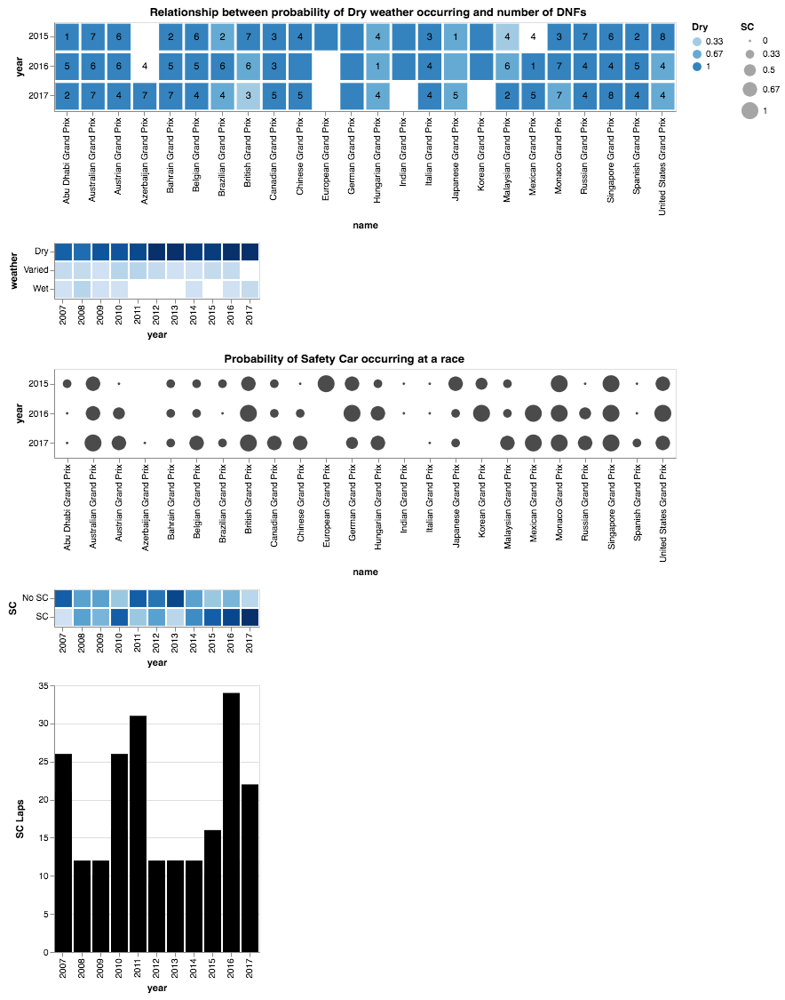

In [42]:
hover = alt.selection_single(on='mouseover', nearest=True, fields=['name'], empty='all')

base_ww = alt.Chart(ww).properties(
    width=700,
    height=100,
    title="Relationship between probability of Dry weather occurring and number of DNFs"
).add_selection(hover)

points_ww = base_ww.mark_rect().encode(
    x='name',
    y='year:O',
    color=alt.condition(hover, 'Dry:O', alt.value('lightgray'))
).interactive()

bar_ww = alt.Chart(weather).mark_bar().encode(
    x='year:O',
    y='weather',
    color=alt.Color('count()', legend=None)
).transform_filter(
    hover
)

base_sc = alt.Chart(sc).properties(
    width=700,
    height=100,
    title="Probability of Safety Car occurring at a race"
).add_selection(hover)

points_sc = base_sc.mark_circle().encode(
    x='name',
    y='year:O',
    size=alt.Size('SC:O'),
    color=alt.condition(hover, alt.value('black'), alt.value('grey')),
).interactive()

bar_sc = alt.Chart(weather).mark_bar().encode(
    x='year:O',
    y='SC:O',
    color=alt.Color('count()', legend=None)
).transform_filter(
    hover
)

bar_sclaps = alt.Chart(weather).mark_bar(color='black').encode(
    x='year:O',
    y='SC Laps:Q',
).transform_filter(
    hover
)

text = alt.Chart(dataset_new).mark_text(baseline='middle').encode(
    x='name',
    y='year:O',
    text='count()',
    color=alt.condition(alt.datum['SC'] == 1.0, alt.value('white'), alt.value('black'))
).transform_filter(
    alt.datum.statusId == 0
)

points_ww + text & bar_ww & points_sc & bar_sc & bar_sclaps

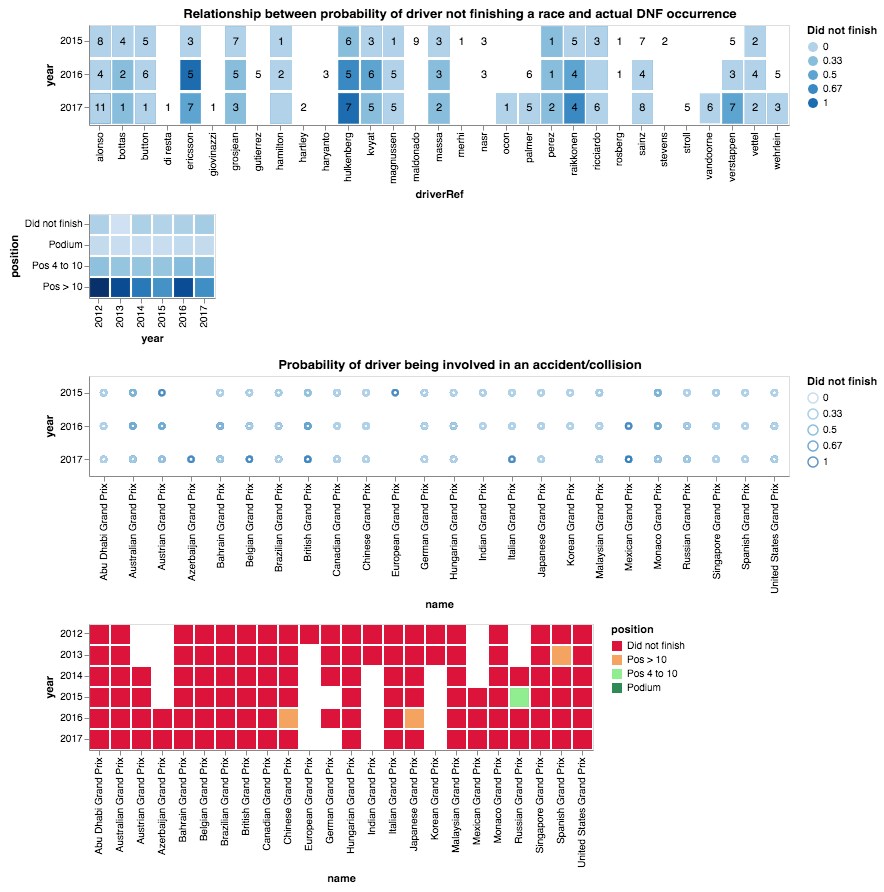

In [43]:
results1317 = results[results['year'] > 2011]

hover = alt.selection_single(on='mouseover', nearest=True, fields=['driverRef'])

base_pos = alt.Chart(pos).properties(
    width=700,
    height=100,
    title="Relationship between probability of driver not finishing a race and actual DNF occurrence"
).add_selection(hover)

points_pos = base_pos.mark_rect().encode(
    x='driverRef',
    y='year:O',
    color=alt.condition(hover, 'Did not finish:O', alt.value('lightgray')),
).interactive()


line_pos = alt.Chart(pos).mark_point().encode(
    x='name',
    y='year:O',
    color=alt.Color('Did not finish:O'),
).transform_filter(
    hover
).properties(
    width=700,
    height=100,
    title="Probability of driver being involved in an accident/collision"
)

bar_pos = alt.Chart(results1317).mark_bar().encode(
    x='year:O',
    y='position',
    color=alt.Color('count()', legend=None)
).transform_filter(
    hover
)

bar_pos1 = alt.Chart(results1317).mark_bar().encode(
    x='name',
    y='year:O',
    color=alt.Color('position', scale=alt.Scale(domain=['Did not finish', 'Pos > 10', 'Pos 4 to 10', 'Podium'], range=['crimson', 'sandybrown', 'lightgreen', 'seagreen']))
).transform_filter(
    hover
)

text = alt.Chart(dataset_new).mark_text(baseline='middle').encode(
    x='driverRef',
    y='year:O',
    text='count()',
    color=alt.condition(alt.datum['SC'] == 1, alt.value('white'), alt.value('black'))
).transform_filter(
    alt.datum.statusId == 0
)

points_pos + text &  bar_pos & line_pos & bar_pos1

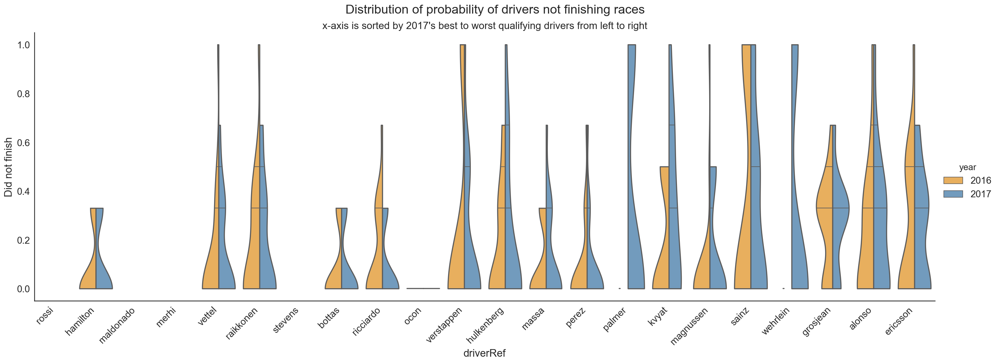

In [47]:
index_list = ['year', 'name', 'driverRef']
target_var_list = ['statusId']

# List of drivers participating in the respective seasons
drivers16 = results[results['year'] == 2016].driverRef.unique()
drivers17 = results[results['year'] == 2017].driverRef.unique()

# Find the differences in drivers particiapting in 2016 and 2017
drivers_toremove = list(set(drivers16) - set(drivers17)) + list(set(drivers17) - set(drivers16))
drivers_toremove.extend(['hartley', 'vandoorne', 'button'])

# Data transformation: Qualifying position
def scoring(x):
    return x * x.name

qual_crosstab = pd.crosstab(dataset_new['driverRef'], dataset_new['position'])
qual_crosstab = qual_crosstab.apply(lambda x: scoring(x))
qual_crosstab['total'] = qual_crosstab.sum(axis=1)
qual_crosstab.sort_values('total', ascending=True, inplace=True)

# List of best qualifiers
qual_crosstab = qual_crosstab.reset_index()
qual_crosstab = qual_crosstab[~qual_crosstab['driverRef'].isin(drivers_toremove)]
best_qualifiers = list(qual_crosstab.driverRef)

dataset_1617 = dataset_new[dataset_new['year'].isin([2016,2017])]

def dnf_acc_plot():
    
    flatui = ["#ffb347", "#659CCA"]
    sns.set_palette(flatui)

    g = sns.factorplot(x="driverRef",
                       y="Did not finish",
                       order=best_qualifiers, # sort x-axis by best qualifying drivers
                       hue="year", 
                       data=dataset_1617,
                       kind="violin", 
                       split=True, 
                       scale="count", 
                       inner="stick",
                       cut=0, 
                       bw=.5,
                       size=7, aspect=3)
    
    for ax in g.axes.flat: 
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right') 

    plt.suptitle('Distribution of probability of drivers not finishing races', y=1.05, fontsize=20)
    plt.title("x-axis is sorted by 2017's best to worst qualifying drivers from left to right", fontsize=16)
    
dnf_acc_plot()

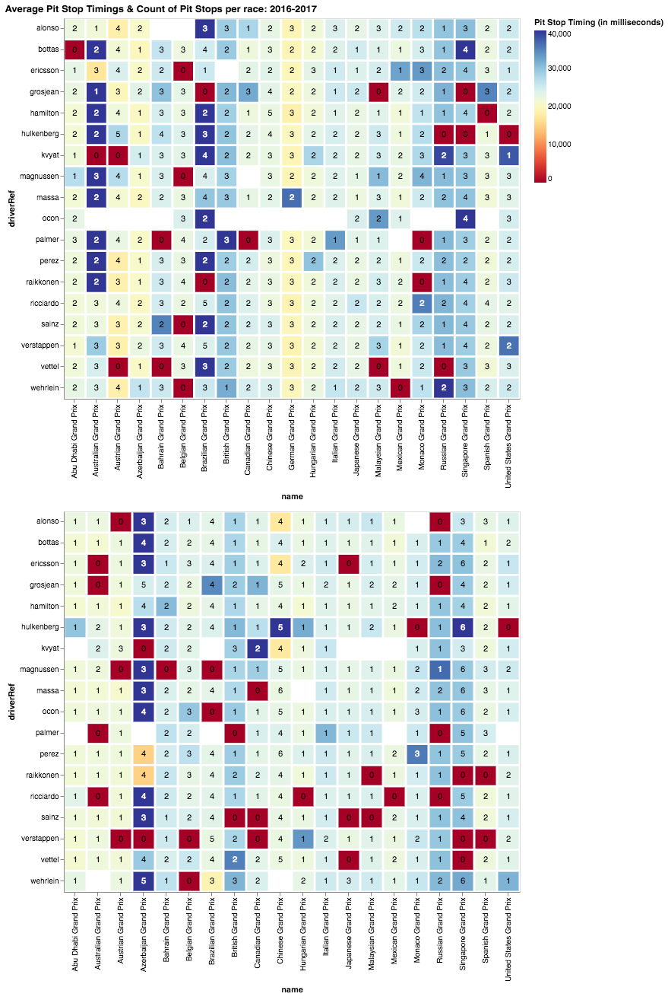

In [48]:
pitStops16 = pitStops[(pitStops['year'] == 2016) & ~(pitStops['driverRef'].isin(drivers_toremove))]
pitStops17 = pitStops[(pitStops['year'] == 2017) & ~(pitStops['driverRef'].isin(drivers_toremove))]

heatmap_16 = alt.Chart(pitStops16).mark_rect().encode(
    x='name',
    y='driverRef',
    color=alt.Color('mean(milliseconds):Q', scale=alt.Scale(zero=False, domain=[0, 40000], scheme='redyellowblue'))
).properties(
    width=600,
    height=500
)

heatmap_17 = alt.Chart(pitStops17).mark_rect().encode(
    x='name',
    y='driverRef',
    color=alt.Color('mean(milliseconds):Q', title="Pit Stop Timing (in milliseconds)", scale=alt.Scale(zero=False, domain=[0, 40000], scheme='redyellowblue'))
).properties(
    width=600,
    height=500
)

text_16 = alt.Chart(pitStops16).mark_text(baseline='middle').encode(
    x='name',
    y='driverRef',
    text='stop',
    color=alt.condition((alt.datum['milliseconds'] ==0) and (alt.datum['milliseconds'] >35000), alt.value('white'), alt.value('black'))
)

text_17 = alt.Chart(pitStops17).mark_text(baseline='middle').encode(
    x='name',
    y='driverRef',
    text='stop',
    color=alt.condition((alt.datum['milliseconds'] ==0) and (alt.datum['milliseconds'] >35000), alt.value('white'), alt.value('black'))
)

pitStop_plot = alt.vconcat(
                    heatmap_16 + text_16, 
                    heatmap_17 + text_17,
                    title="Average Pit Stop Timings & Count of Pit Stops per race: 2016-2017"
                )

pitStop_plot

### How well do the predictors relate to the target variable?

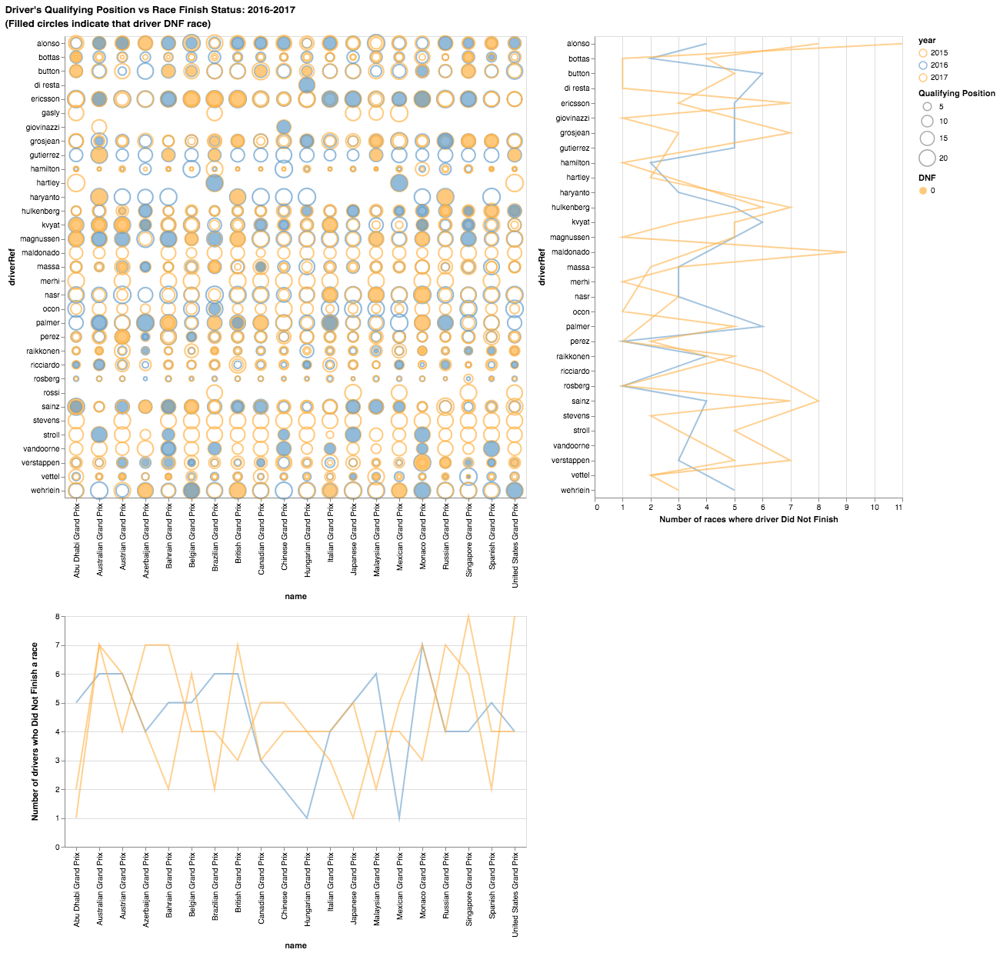

In [55]:
circ = alt.Chart(dataset_new).mark_point().encode(
    x='name',
    y='driverRef',
    size=alt.Size('position', title="Qualifying Position", scale=alt.Scale(range=[0, 500])),
    color=alt.Color('year:N', scale=alt.Scale(range=["#ffb347", "#659CCA"])),
).properties(
    width=600,
    height=600
)

fill_16 = circ.mark_point().encode(
    fill=alt.FillValue("#ffb347"),
    shape=alt.Shape('statusId', legend=alt.Legend(title="DNF"))
).transform_filter(
    (alt.datum.statusId == 0) & (alt.datum.year == 2016)
)

fill_17 = circ.mark_point().encode(
    fill=alt.FillValue("#659CCA"),
    shape=alt.Shape('statusId', legend=alt.Legend(title="DNF"))
).transform_filter(
    (alt.datum.statusId == 0) & (alt.datum.year == 2017)
)

bar_H = alt.Chart(dataset_new).mark_line(opacity=0.6).encode(
    x='name',
    y=alt.Y('count()', title='Number of drivers who Did Not Finish a race'),
    color=alt.Color('year:N', scale=alt.Scale(range=["#ffb347", "#659CCA"])),
).transform_filter(
    (alt.datum.statusId == 0) 
).properties(
    width=600
)

bar_V = alt.Chart(dataset_new).mark_line(opacity=0.6).encode(
    x=alt.X('count()', title='Number of races where driver Did Not Finish'),
    y='driverRef',
    color=alt.Color('year:N', scale=alt.Scale(range=["#ffb347", "#659CCA"])),
).transform_filter(
    (alt.datum.statusId == 0)
).properties(
    height=600
)

VC = alt.vconcat(
    circ+fill_16+fill_17,
    bar_H,
    title="(Filled circles indicate that driver DNF race)"
)

qual_plot = alt.hconcat(
    VC,
    bar_V,
    title="Driver's Qualifying Position vs Race Finish Status: 2016-2017"
)

qual_plot

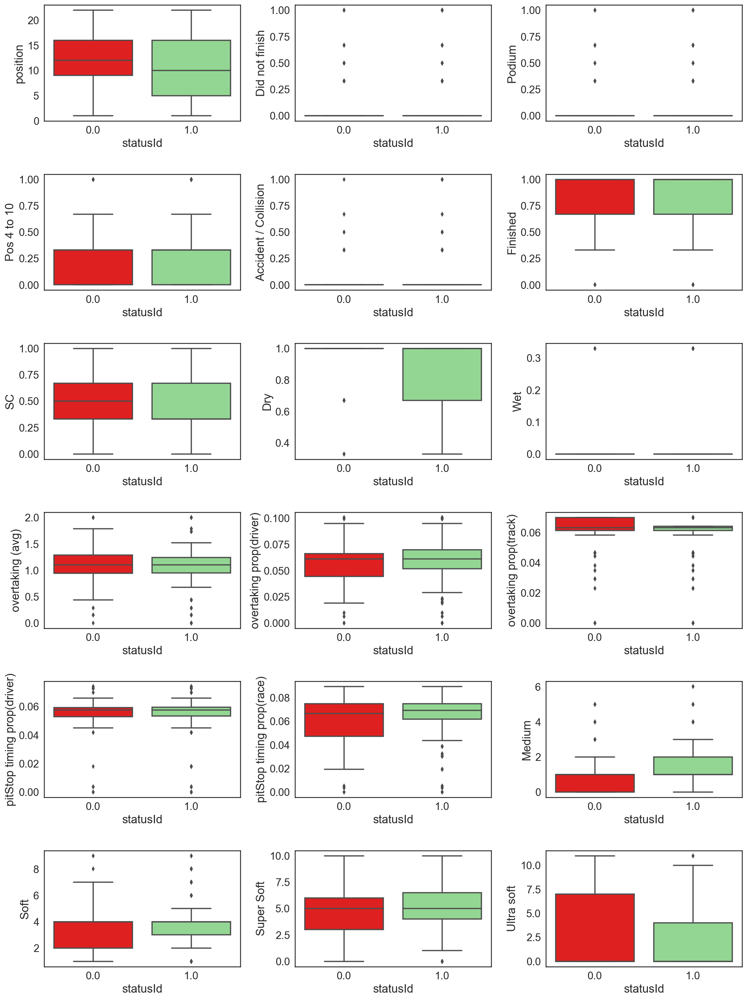

In [49]:
def boxplot(df, index_list, target_var_list):
    
    df_new = df.drop(index_list+target_var_list, axis=1)

    nrows = len(df_new.columns)//3
    ncols = 3
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,20))
    
    my_pal = {0.0: "#FF0000", 1.0: "#88e188"}
    
    i=0
    for row in range(nrows):
        for col in range(ncols):
            g = sns.boxplot(y=df_new.iloc[:,i], x=df[target_var_list[0]], palette=my_pal, ax=axes[row][col])
            i=i+1
    plt.tight_layout(pad=0.8, w_pad=0.8, h_pad=1.0)
    
boxplot(dataset_new, index_list, target_var_list)

/Users/dianaow/anaconda2/lib/python2.7/site-packages/numpy/core/fromnumeric.py:52: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


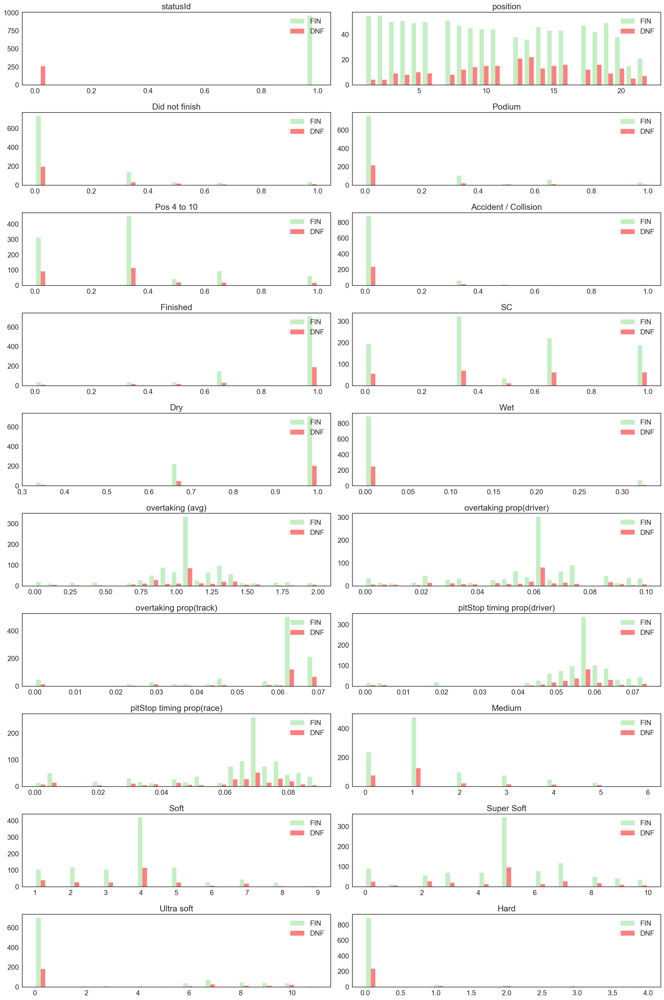

In [50]:
def barplots(df):
    
    df1 = df.drop(index_list, axis=1)
    
    def sephist(df, col):
        yes = df[df['statusId'] == 1][col]
        no = df[df['statusId'] == 0][col]
        return yes, no

    plt.figure(figsize=(20,30))
    for num in range(len(df1.columns)-1):
        plt.subplot(len(df1.columns)//2, 2, num+1)
        plt.hist((sephist(df1, df1.iloc[:,num].name)[0], sephist(df1, df1.iloc[:,num].name)[1]), bins=25, alpha=0.5, label=['FIN', 'DNF'], color=["#88e188", "#FF0000"])
        plt.legend(loc='upper right')
        plt.title(df1.iloc[:,num].name)
    plt.tight_layout(pad=0.8, w_pad=0.8, h_pad=1.0)
    
barplots(dataset_new)

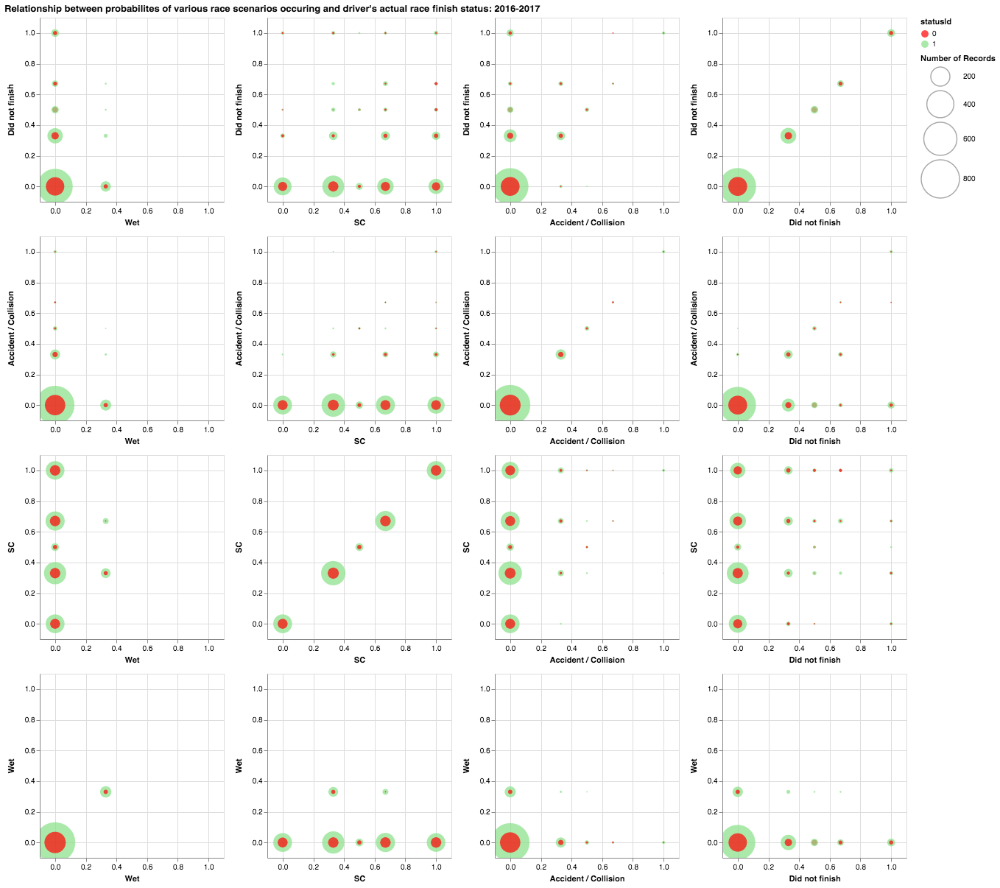

In [51]:
scatterplot = alt.Chart(dataset_new).mark_circle(opacity=0.7).encode(
        alt.X(alt.repeat("column"), type='quantitative', scale=alt.Scale(domain=[-0.1, 1.1])),
        alt.Y(alt.repeat("row"), type='quantitative', scale=alt.Scale(domain=[-0.1, 1.1])),
        alt.Color('statusId:N', scale=alt.Scale(range=["#FF0000", "#88e188"])),
        alt.Size('count()', scale=alt.Scale(range=[0, 3000]))
    ).properties(
        width=250,
        height=250,
    ).repeat(
        row=['Did not finish', 'Accident / Collision', 'SC', 'Wet'],
        column=['Wet', 'SC', 'Accident / Collision', 'Did not finish'],
        title="Relationship between probabilites of various race scenarios occuring and driver's actual race finish status: 2016-2017"
    ).interactive()

scatterplot

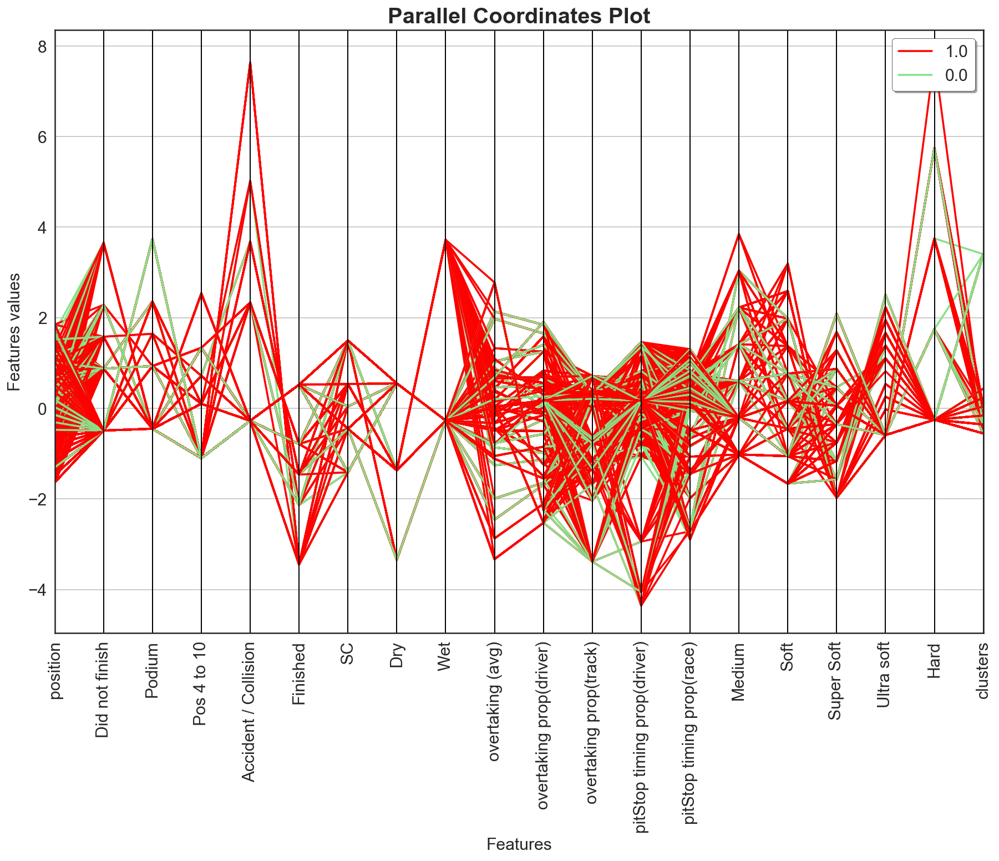

In [52]:
from pandas.plotting import parallel_coordinates

def parallel_coordinates_plot(df):
    
    df_new = df.drop(index_list+target_var_list, axis=1)
    
    SS = StandardScaler()
    Xs_train = pd.DataFrame(SS.fit_transform(df_new))
    Xs_train.columns = df_new.columns
    Xs_train_new = pd.concat([Xs_train.reset_index(drop=True), df[target_var_list].reset_index(drop=True)], axis=1)
    
    plt.figure(figsize=(15,10))
    parallel_coordinates(Xs_train_new, "statusId", color=["#FF0000", "#88e188"])
    plt.title('Parallel Coordinates Plot', fontsize=20, fontweight='bold')
    plt.xlabel('Features', fontsize=15)
    plt.ylabel('Features values', fontsize=15)
    plt.legend(loc=1, prop={'size': 15}, frameon=True,shadow=True, facecolor="white", edgecolor="black")
    plt.xticks(rotation=90)
    plt.show()
    
parallel_coordinates_plot(dataset_new)

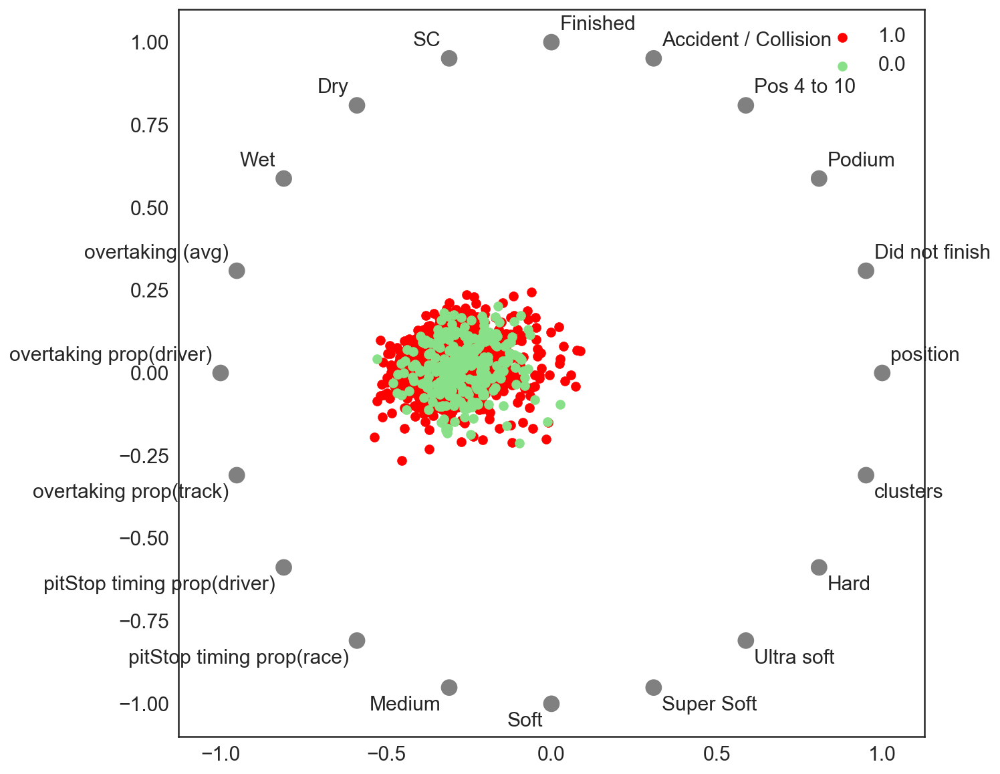

In [53]:
from pandas.plotting import radviz

def classification_radviz(df):
    
    df_new = df.drop(index_list+target_var_list, axis=1)
    
    SS = StandardScaler()
    Xs_train = pd.DataFrame(SS.fit_transform(df_new))
    Xs_train.columns = df_new.columns
    Xs_train_new = pd.concat([Xs_train.reset_index(drop=True), df[target_var_list].reset_index(drop=True)], axis=1)
    
    plt.figure(figsize=(10,10))
    radviz(Xs_train_new, 'statusId', color=["#FF0000", "#88e188"])
    plt.show()
    
classification_radviz(dataset_new)

#### From the graphs above, there is no clear linear relationship between features and target variable, meaning that none of the features except for qualifying position give a good indication whether or not a driver will finish a race or not. I expect that classification of race finish status will not be an easy task. Since we have non-linearly separable data, perhaps trees-based classifiers and neural networks will perform best with this dataset.